<a href="https://colab.research.google.com/github/kevin801221/CNN-and-computer-vision/blob/master/Roboflow_Custom_Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 如何在自定義對象上訓練 Detectron2

本教程實現了facebook新的"Detectron2 Library"(https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/) .此Noteook顯示了有關您的**自定義圖**像的物件檢測訓練。


值得注意的是，Detectron2 Library其實遠遠超出了object detection的範圍，支援語義分割(segmentation)、關鍵點檢測(key point detection)、掩碼(Mask)和densepose。


### 本教程中介紹的步驟

在本教程中，我們將演練在自定義對象上訓練 Detectron2 所需的步驟。我們使用 [Chess dataset](https://public.roboflow.com/object-detection/chess-full),這是開源、免費使用的。您還可以**對自己的數據使用此筆記本**。

為了訓練我們的detector，我們採取以下步驟：

* 安裝 Detectron2 
* 下載自定義好的 Detectron2 物件檢測數據->我們用chest 數據集記得嗎?
* 可視化 Detectron2 訓練數據
* 編寫我們的 Detectron2 訓練配置
* 運行 Detectron2 訓練
* 評估此 Detectron2 性能
* 對test images運行 Detectron2 ，給我們的model來個大考。


# 安裝 Detectron2 Dependencies

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 24 kB/s 
     |████████████████████████████████| 6.6 MB 40.4 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.5.0+cu101 which is incompatible.
     |████████████████████████████████| 274 kB 5.2 MB/s 
  Created wheel fo

In [2]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2 MB 753 kB/s 
     |████████████████████████████████| 50 kB 2.8 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220305-py3-none-any.whl size=61214 sha256=207936620e6fb30d96b59670943d83f8155326d4efb385d9139a8f30c329c78a
  Stored in directory: /root/.cache/pip/wheels/b5/b7/6e/43b1693d06fac3633af48db68557513b0a37ab38b0a8b798f9
Successfully built fvcore


In [3]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# 載入和註冊客製化Detectron2數據

In [4]:
#我們需要import我們自己的dataset
!curl -L "{https://app.roboflow.com/ds/vKpTNrt8jP?key=ZQaDl4kQwa}" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0   1953      0 --:--:-- --:--:-- --:--:--  1953
100 18.1M  100 18.1M    0     0  23.8M      0 --:--:-- --:--:-- --:--:--  437M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/0b47311f426ff926578c9d738d683e76_jpg.rf.dbb5c51639ff45feba0ee52ff713b058.jpg  
 extracting: test/1c0060ef868bdc326ce5e6389cb6732f_jpg.rf.c3eff46df522af2a9c86da00f82bca8e.jpg  
 extracting: test/2f6fb003bb89cd401322a535acb42f65_jpg.rf.126352a1e3aea0431abdd86bc1d68ef9.jpg  
 extracting: test/410993714e325a1de3e394ffe860df3a_jpg.rf.09236050f747250ed35061ec10cc2d45.jpg  
 extracting: test/4e3117459d759798537eb52cf5bf534d_jpg.rf.e61b26b9f04d7e16cc6c104e7d6245e7.jpg  
 extracting: test/5a35ba2ec3e0d0b2b12b1758a8ac29aa_jpg.rf.f1da1e36ffcc05f522a20f0

In [5]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [03/07 15:38:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/07 15:38:07 d2.data.datasets.coco]: Loaded 606 images in COCO format from /content/train/_annotations.coco.json


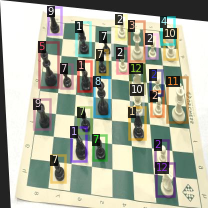

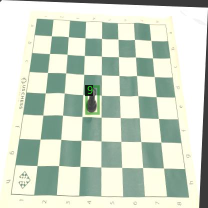

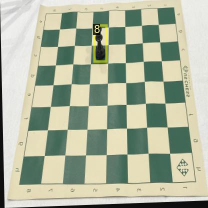

In [6]:
#可視化訓練資料
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

#訓練我們的客製化專屬Detectron2 Detector

In [7]:
#我們在這裡導入我們自己的訓練模組，以便在訓練期間使用COCO的驗證評估。否則，將不會產生驗證評估。

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [8]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/07 15:38:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:07, 58.3MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_p

[03/07 15:38:29 d2.engine.train_loop]: Starting training from iteration 0
[03/07 15:40:04 d2.utils.events]:  eta: 2:01:10  iter: 19  total_loss: 2.011  loss_cls: 1.462  loss_box_reg: 0.098  loss_rpn_cls: 0.366  loss_rpn_loc: 0.074  time: 4.6979  data_time: 0.0375  lr: 0.000020  max_mem: 7235M
[03/07 15:41:40 d2.utils.events]:  eta: 2:00:29  iter: 39  total_loss: 1.484  loss_cls: 1.195  loss_box_reg: 0.152  loss_rpn_cls: 0.026  loss_rpn_loc: 0.060  time: 4.7484  data_time: 0.0194  lr: 0.000040  max_mem: 7235M
[03/07 15:43:15 d2.utils.events]:  eta: 1:58:24  iter: 59  total_loss: 1.100  loss_cls: 0.855  loss_box_reg: 0.132  loss_rpn_cls: 0.013  loss_rpn_loc: 0.055  time: 4.7460  data_time: 0.0189  lr: 0.000060  max_mem: 7235M
[03/07 15:44:52 d2.utils.events]:  eta: 1:57:24  iter: 79  total_loss: 0.935  loss_cls: 0.718  loss_box_reg: 0.140  loss_rpn_cls: 0.014  loss_rpn_loc: 0.041  time: 4.7741  data_time: 0.0170  lr: 0.000080  max_mem: 7235M
[03/07 15:46:27 d2.utils.events]:  eta: 1:55:4

In [9]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [10]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [03/07 17:40:05 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/07 17:40:05 d2.data.datasets.coco]: Loaded 28 images in COCO format from /content/test/_annotations.coco.json
[03/07 17:40:06 d2.data.build]: Distribution of instances among all 14 categories:
|   category   | #instances   | category   | #instances   | category   | #instances   |
|:------------:|:-------------|:-----------|:-------------|:-----------|:-------------|
| chess-pieces | 0            | 0          | 0            | 1          | 21           |
|      2       | 88           | 3          | 14           | 4          | 20           |
|      5       | 17           | 6          | 25           | 7          | 86           |
|      8       | 14           | 9          | 26           | 10         | 25           |
|      11      | 15           | 12         | 25           |            |              |
|    total     | 376          |            |     

OrderedDict([('bbox',
              {'AP': 10.006843017155454,
               'AP-0': nan,
               'AP-1': 55.86416524726785,
               'AP-10': 0.0,
               'AP-11': 0.0,
               'AP-12': 0.0,
               'AP-2': 64.2179509585976,
               'AP-3': 0.0,
               'AP-4': 0.0,
               'AP-5': 0.0,
               'AP-6': 0.0,
               'AP-7': 0.0,
               'AP-8': 0.0,
               'AP-9': 0.0,
               'AP-chess-pieces': nan,
               'AP50': 14.684939100252922,
               'AP75': 13.316583343475966,
               'APl': nan,
               'APm': 10.007598157159286,
               'APs': 10.841207215214647})])

# 使用Detectron2推理(inference)並已儲存的權重



In [14]:
%ls ./output/

coco_instances_results.json                       last_checkpoint
events.out.tfevents.1646667502.6464b620bba1.79.0  metrics.json
instances_predictions.pth                         model_final.pth


In [12]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

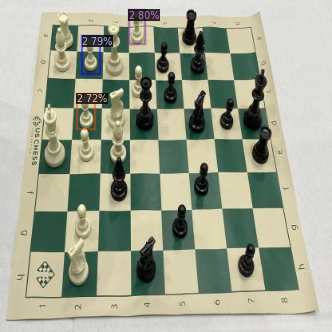

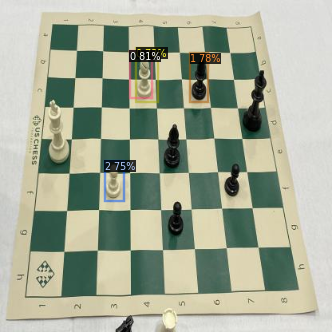

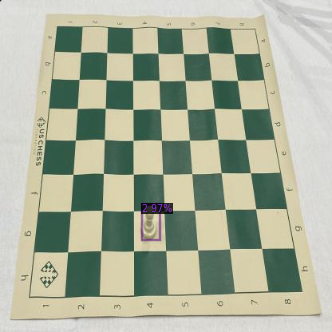

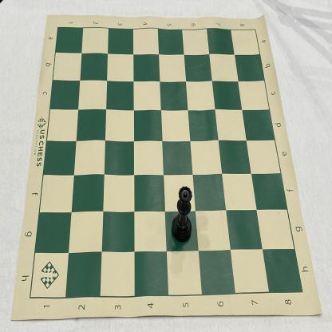

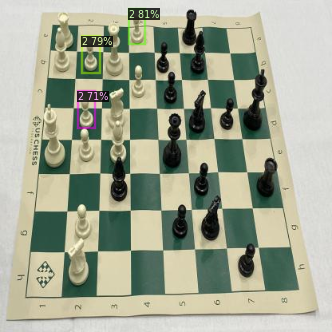

...

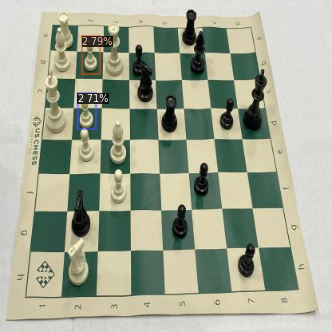

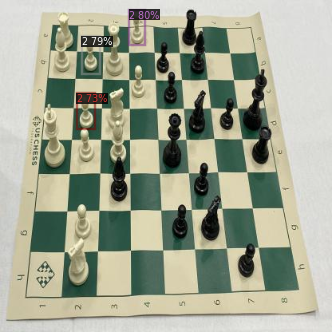

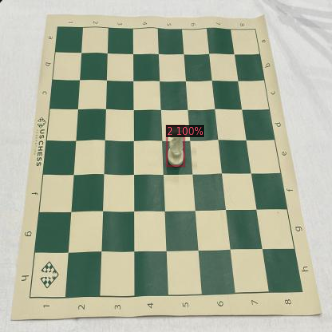

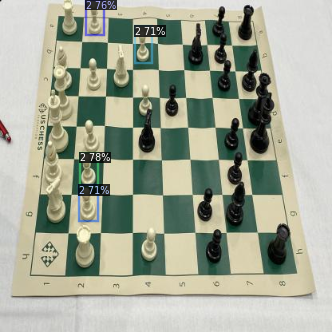

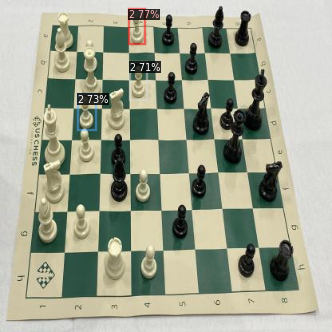

In [13]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
